# Módulo de estatística 

## Projeto A - Análise do dataset "Wine Quality"

### Grupo

Diego Felipe Alves  Batista

Johnny Hideki Horita

Lucas Rodrigues Cruz

Thalita Regina Gomes de Sa

Vitor Rosa Castro dos Santos

### Instruções

- O projeto deverá ser entregue até dia 22/11 antes do início da aula
- O projeto poderá ser feito em grupo com até 4 integrantes
- Serão 2 projetos A e B porém apenas 1 projeto deverá ser entregue e escolhido pelo grupo

- A entrega deve ser feita em jupyter notebook com os códigos explícitos e comentados. Além disso os conceitos, decisões e conclusões usadas devem estar destacadas no notebook

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

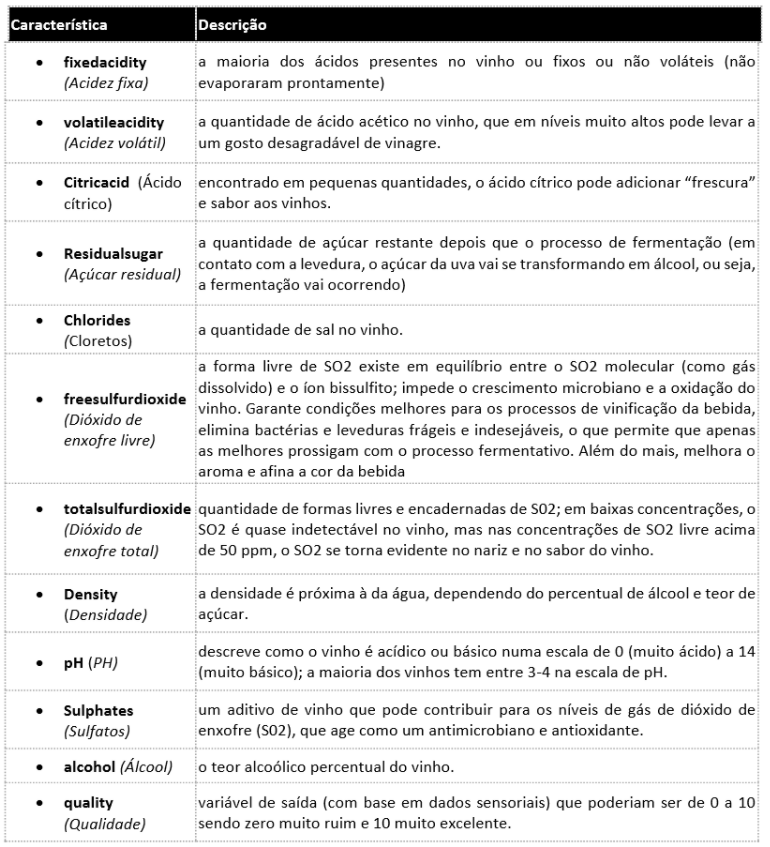

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)



### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

## Importando bibliotecas

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import spearmanr

from datetime import datetime
from collections import Counter
import warnings

#%matplotlib inline


In [2]:
#Padronizações

sns.set_style('darkgrid') # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=18)     # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rc('font', size=13)          # controls default text sizes
colors = sns.color_palette('pastel')

#sns.color_palette('deep') # deep, pastel, Set1 Set2 Set3

In [3]:
warnings.filterwarnings('ignore')

## Etapa 1

**AED - Análise exploratória de dados**

### Carregando arquivos

In [4]:
# Carrega os arquivos nos dataframes (arquivos da internet)
# Arquivo de vinhos tintos
url_wine = 'https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/'
file_r = 'winequality-red.csv'
df_r = pd.read_csv(url_wine + file_r, sep=';', encoding='utf8')

# Arquivo de vinhos brancos
file_w = 'winequality-white.csv'
df_w = pd.read_csv(url_wine + file_w, sep=';', encoding='utf8')

#### winequality-red.csv

In [5]:
# Verificando o tamanho do dataframe (Linhas x Colunas)
lin, col = df_r.shape
print(f'Informações do arquivo: {file_r}')
print(f'Linhas.: {lin}\nColunas: {col}')

Informações do arquivo: winequality-red.csv
Linhas.: 1599
Colunas: 12


In [6]:
# Visualizando os primeiros registros do dataframe
df_r.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
# Obtendo as informações de colunas e tipo das colunas do dataframe
df_r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [8]:
# Obtendo informações gerais dos valores que cada coluna numérica contém
df_r.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [9]:
# Veriricando linhas duplicadas

# Cria novo dataframe
# Seleciona todas as linhas duplicadas no dataframe baseado em todas as colunas
df_r_duplicateRows = df_r[df_r.duplicated(keep=False)].copy()
print("Todas as linhas duplicadas:")
print(df_r_duplicateRows.shape)

Todas as linhas duplicadas:
(460, 12)


In [10]:
# Lista o Dataframe com as linhas duplicadas
df_r_duplicateRows.sort_values(by=list(df_r.columns))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
142,5.2,0.340,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6
144,5.2,0.340,0.00,1.8,0.050,27.0,63.0,0.99160,3.68,0.79,14.0,6
131,5.6,0.500,0.09,2.3,0.049,17.0,99.0,0.99370,3.63,0.63,13.0,5
132,5.6,0.500,0.09,2.3,0.049,17.0,99.0,0.99370,3.63,0.63,13.0,5
1488,5.6,0.540,0.04,1.7,0.049,5.0,13.0,0.99420,3.72,0.58,11.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
391,13.7,0.415,0.68,2.9,0.085,17.0,43.0,1.00140,3.06,0.80,10.0,6
243,15.0,0.210,0.44,2.2,0.075,10.0,24.0,1.00005,3.07,0.84,9.2,7
244,15.0,0.210,0.44,2.2,0.075,10.0,24.0,1.00005,3.07,0.84,9.2,7
554,15.5,0.645,0.49,4.2,0.095,10.0,23.0,1.00315,2.92,0.74,11.1,5


In [11]:
# Dataframe com as linhas duplicadas mantendo a primeira ocorrência do registro
df_r_duplicateRows = df_r_duplicateRows[df_r_duplicateRows.duplicated(keep='first')].copy()
print("Dataframe sem duplicidade:")
print(df_r_duplicateRows.shape)

Dataframe sem duplicidade:
(240, 12)


In [12]:
#df_r_clean.reset_index(drop=True)
df_r_duplicateRows

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [13]:
# Informações dos dataframes de Investimento
print(f'Dataframe df_r: {df_r.shape[0]}')
print(f'Dataframe df_r_duplicateRows: {df_r_duplicateRows.shape[0]}')

print(f'\nQuantidade esperada após exclusão dos dados duplicados: {len(df_r) - len(df_r_duplicateRows)}')

Dataframe df_r: 1599
Dataframe df_r_duplicateRows: 240

Quantidade esperada após exclusão dos dados duplicados: 1359


In [14]:
# Excluindo os linhas duplicadas
df_r_clean = df_r.drop_duplicates(keep='first').copy()
df_r_clean.shape

(1359, 12)

In [15]:
# Obtendo as informações de colunas e tipo das colunas do dataframe
df_r_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


In [16]:
# Obtendo informações gerais dos valores que cada coluna numérica contém
df_r_clean.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


#### winequality-white.csv

In [17]:
# Verificando o tamanho do dataframe (Linhas x Colunas)
lin, col = df_w.shape
print(f'Informações do arquivo: {file_w}')
print(f'Linhas.: {lin}\nColunas: {col}')

Informações do arquivo: winequality-white.csv
Linhas.: 4898
Colunas: 12


In [18]:
# Visualizando os primeiros registros do dataframe
df_w.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [19]:
# Obtendo as informações de colunas e tipo das colunas do dataframe
df_w.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [20]:
# Obtendo informações gerais dos valores que cada coluna numérica contém
df_w.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [21]:
# Cria novo dataframe
# Seleciona todas as linhas duplicadas no dataframe baseado em todas as colunas
df_w_duplicateRows = df_w[df_w.duplicated(keep=False)].copy()
print("Todas as linhas duplicadas:")
print(df_w_duplicateRows.shape)

Todas as linhas duplicadas:
(1709, 12)


In [22]:
# Lista o Dataframe com as linhas duplicadas
df_w_duplicateRows.sort_values(by=list(df_w.columns))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4671,4.9,0.335,0.14,1.3,0.036,69.0,168.0,0.99212,3.47,0.46,10.466667,5
4672,4.9,0.335,0.14,1.3,0.036,69.0,168.0,0.99212,3.47,0.46,10.466667,5
3941,4.9,0.345,0.34,1.0,0.068,32.0,143.0,0.99138,3.24,0.40,10.100000,5
3950,4.9,0.345,0.34,1.0,0.068,32.0,143.0,0.99138,3.24,0.40,10.100000,5
2990,5.0,0.270,0.32,4.5,0.032,58.0,178.0,0.98956,3.45,0.31,12.600000,7
...,...,...,...,...,...,...,...,...,...,...,...,...
2312,9.4,0.280,0.30,1.6,0.045,36.0,139.0,0.99534,3.11,0.49,9.300000,5
3094,9.7,0.240,0.49,4.9,0.032,3.0,18.0,0.99368,2.85,0.54,10.000000,6
3095,9.7,0.240,0.49,4.9,0.032,3.0,18.0,0.99368,2.85,0.54,10.000000,6
1372,10.7,0.220,0.56,8.2,0.044,37.0,181.0,0.99800,2.87,0.68,9.500000,6


In [23]:
# Dataframe com as linhas duplicadas mantendo a primeira ocorrência do registro
df_w_duplicateRows = df_w_duplicateRows[df_w_duplicateRows.duplicated(keep='first')].copy()
print("Dataset sem linhas duplicadas:")
print(df_w_duplicateRows.shape)

Dataset sem linhas duplicadas:
(937, 12)


In [24]:
# Informações dos dataframes de Investimento
print(f'Dataframe df_w: {df_w.shape[0]}')
print(f'Dataframe df_w_duplicateRows: {df_w_duplicateRows.shape[0]}')

print(f'\nQuantidade esperada após exclusão dos dados duplicados: {len(df_w) - len(df_w_duplicateRows)}')

Dataframe df_w: 4898
Dataframe df_w_duplicateRows: 937

Quantidade esperada após exclusão dos dados duplicados: 3961


In [25]:
# Excluindo os linhas duplicadas
df_w_clean = df_w.drop_duplicates(keep='first').copy()
df_w_clean.shape

(3961, 12)

In [26]:
# Obtendo as informações de colunas e tipo das colunas do dataframe
df_w_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3961 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         3961 non-null   float64
 1   volatile acidity      3961 non-null   float64
 2   citric acid           3961 non-null   float64
 3   residual sugar        3961 non-null   float64
 4   chlorides             3961 non-null   float64
 5   free sulfur dioxide   3961 non-null   float64
 6   total sulfur dioxide  3961 non-null   float64
 7   density               3961 non-null   float64
 8   pH                    3961 non-null   float64
 9   sulphates             3961 non-null   float64
 10  alcohol               3961 non-null   float64
 11  quality               3961 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 402.3 KB


In [27]:
# Obtendo informações gerais dos valores que cada coluna numérica contém
df_w_clean.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000,3961.000000
mean,6.839346,0.280538,0.334332,5.914819,0.045905,34.889169,137.193512,0.993790,3.195458,0.490351,10.589358,5.854835
std,0.866860,0.103437,0.122446,4.861646,0.023103,17.210021,43.129065,0.002905,0.151546,0.113523,1.217076,0.890683
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.035000,23.000000,106.000000,0.991620,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,4.700000,0.042000,33.000000,133.000000,0.993500,3.180000,0.480000,10.400000,6.000000
75%,7.300000,0.330000,0.390000,8.900000,0.050000,45.000000,166.000000,0.995710,3.290000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


### Analisando Dataframes

df_r_clean = winequality-red.csv

df_w_clean = winequality-white.csv

In [28]:
df = df_r_clean.copy()
#df = df_w_clean.copy() 

In [29]:
df.reset_index(drop=True)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1354,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1355,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1356,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1357,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [30]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

#### Variável quality (target)

In [31]:
# Veriricando os valores da variável
df['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [32]:
# contagem de linhas para cada quality
Counter(df['quality'])

Counter({5: 577, 6: 535, 7: 167, 4: 53, 8: 17, 3: 10})

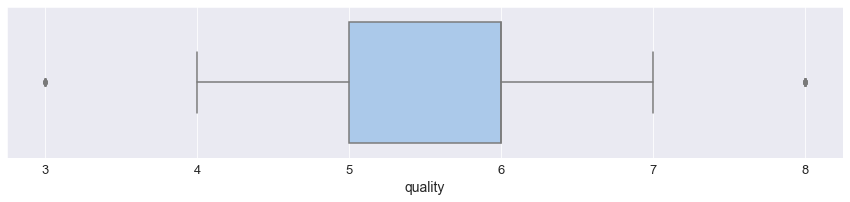

In [33]:
plt.figure(figsize=(12,3), tight_layout=True)
ax = sns.boxplot(data=df, x="quality", palette=colors)
#ax = sns.swarmplot(data=df, x="quality", color=".25")
plt.show()

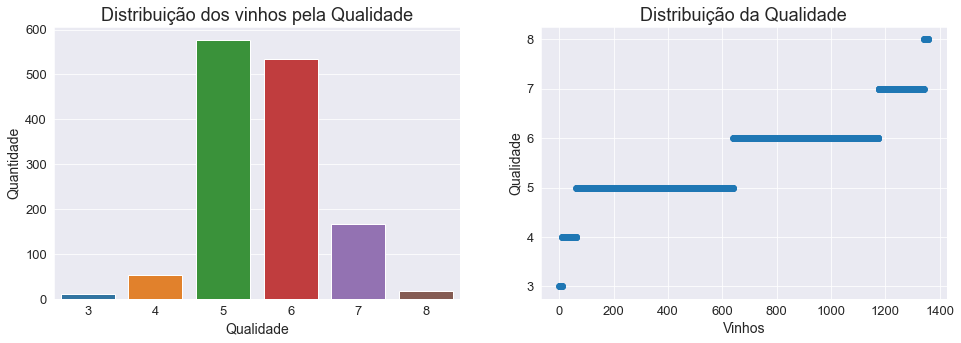

In [34]:
# Plotando gráfico para a distribuição de quality
plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
g = sns.countplot(x='quality', data=df) # definir a contagem do seaborn para conhecer a distribuição de pontos
g.set_title("Distribuição dos vinhos pela Qualidade") # Define o título
g.set_xlabel("Qualidade") # Define o xlabel
g.set_ylabel("Quantidade") # Define o ylabel

plt.subplot(1,2,2)  # Este é o segundo gráfico
plt.scatter(range(df.shape[0]), np.sort(df.quality.values)) # Define a distribuição cumulativa
plt.title("Distribuição da Qualidade")
plt.xlabel('Vinhos')
plt.ylabel('Qualidade')

plt.show()

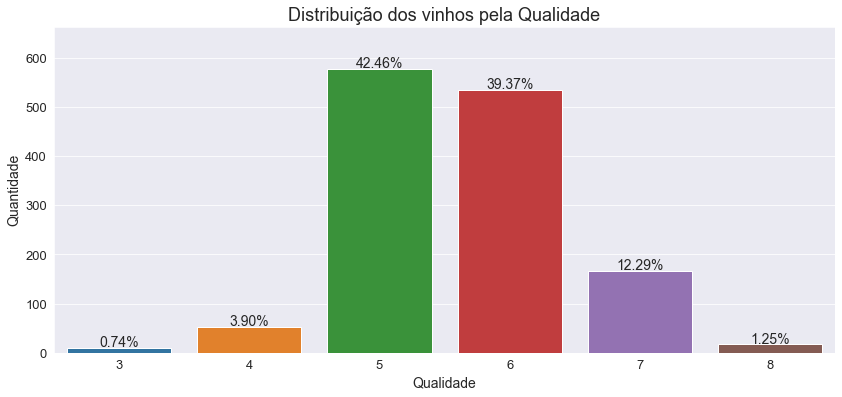

In [35]:
total = len(df)
plt.figure(figsize=(14,6))

g = sns.countplot(x='quality',data=df)
g.set_title("Distribuição dos vinhos pela Qualidade")
g.set_xlabel("Qualidade")
g.set_ylabel("Quantidade")

sizes=[]

for p in g.patches:
    height = p.get_height()
    sizes.append(height)
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format((height/total)*100),
            ha="center", fontsize=14) 
    
g.set_ylim(0, max(sizes) * 1.15)

plt.show()

#### Analisando correlação entre as variáveis

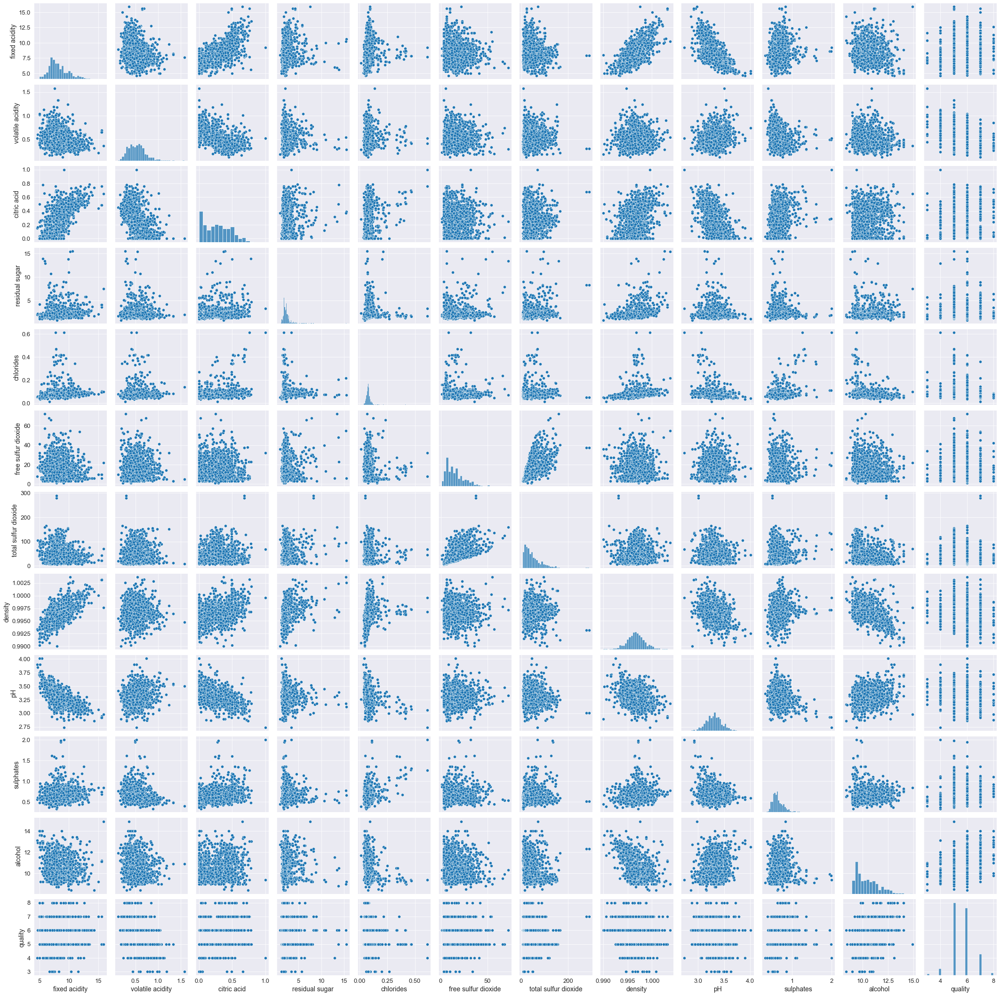

In [36]:
# Verificando a correlação entre as variáveis usando o parplot do Seaborn. 
sns.pairplot(df)
plt.savefig("Plotting_Correlation_pairplot_r.jpg")
plt.show()


<!--df_w_clean = winequality-white.csv -->
<img src = "./Plotting_Correlation_pairplot_w.jpg" width = "100%"></img>

<!--df_r_clean = winequality-red.csv -->
<img src = "./Plotting_Correlation_pairplot_r.jpg" width = "100%"></img>


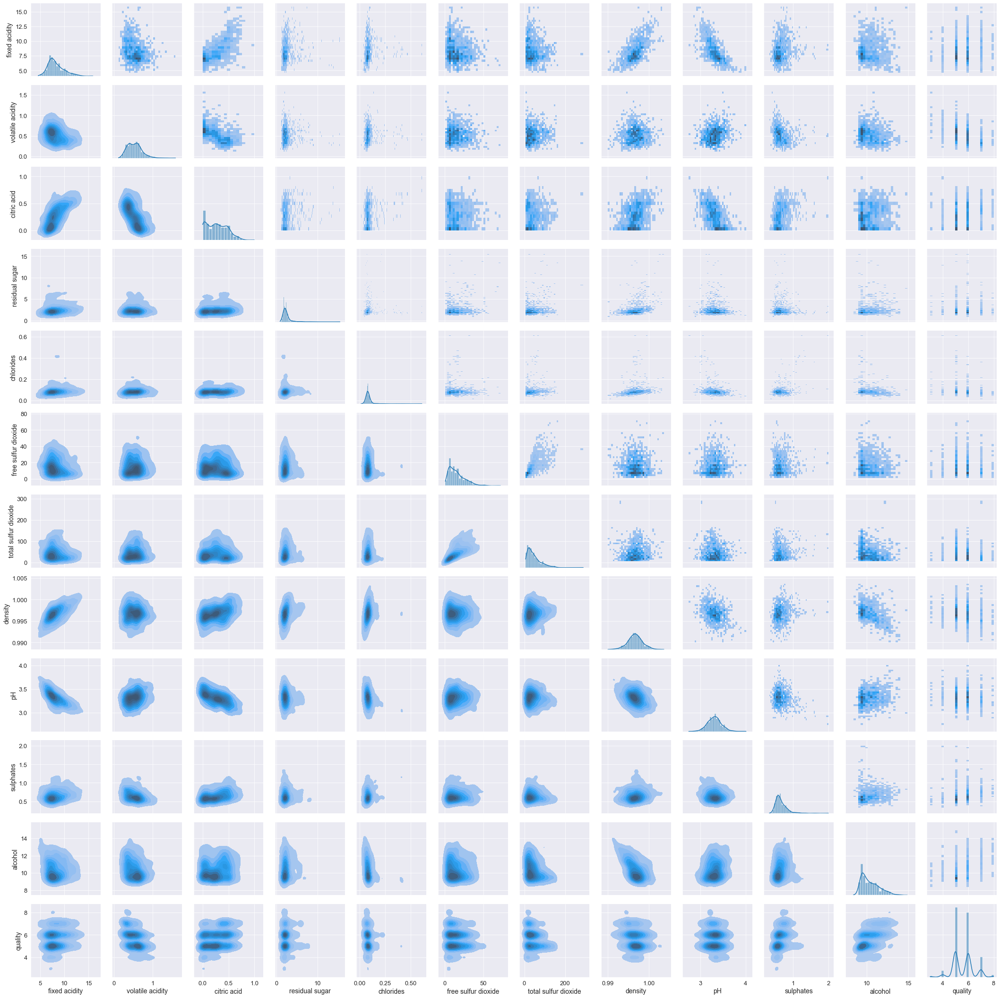

In [37]:
# Verificando a correlação entre as variáveis usando o PairGrid do Seaborn
g = sns.PairGrid(df)
g.map_upper(sns.histplot)
g.map_lower(sns.kdeplot, fill=True)
g.map_diag(sns.histplot, kde=True)
plt.savefig("Plotting_Correlation_PairGrid_r.jpg")
plt.show()



<!--df_w_clean = winequality-white.csv -->
<img src = "./Plotting_Correlation_PairGrid_w.jpg" width = "100%"></img>

<!--df_r_clean = winequality-red.csv -->
<img src = "./Plotting_Correlation_pairplot_r.jpg" width = "100%"></img>

In [38]:
# Verificando a correlação entre as variáveis 
df.corr().style.background_gradient(cmap='YlGnBu')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.255124,0.667437,0.111025,0.085886,-0.140580,-0.103777,0.670195,-0.686685,0.190269,-0.061596,0.119024
volatile acidity,-0.255124,1.000000,-0.551248,-0.002449,0.055154,-0.020945,0.071701,0.023943,0.247111,-0.256948,-0.197812,-0.395214
citric acid,0.667437,-0.551248,1.000000,0.143892,0.210195,-0.048004,0.047358,0.357962,-0.550310,0.326062,0.105108,0.228057
residual sugar,0.111025,-0.002449,0.143892,1.000000,0.026656,0.160527,0.201038,0.324522,-0.083143,-0.011837,0.063281,0.013640
chlorides,0.085886,0.055154,0.210195,0.026656,1.000000,0.000749,0.045773,0.193592,-0.270893,0.394557,-0.223824,-0.130988
free sulfur dioxide,-0.140580,-0.020945,-0.048004,0.160527,0.000749,1.000000,0.667246,-0.018071,0.056631,0.054126,-0.080125,-0.050463
total sulfur dioxide,-0.103777,0.071701,0.047358,0.201038,0.045773,0.667246,1.000000,0.078141,-0.079257,0.035291,-0.217829,-0.177855
density,0.670195,0.023943,0.357962,0.324522,0.193592,-0.018071,0.078141,1.000000,-0.355617,0.146036,-0.504995,-0.184252
pH,-0.686685,0.247111,-0.550310,-0.083143,-0.270893,0.056631,-0.079257,-0.355617,1.000000,-0.214134,0.213418,-0.055245
sulphates,0.190269,-0.256948,0.326062,-0.011837,0.394557,0.054126,0.035291,0.146036,-0.214134,1.000000,0.091621,0.248835


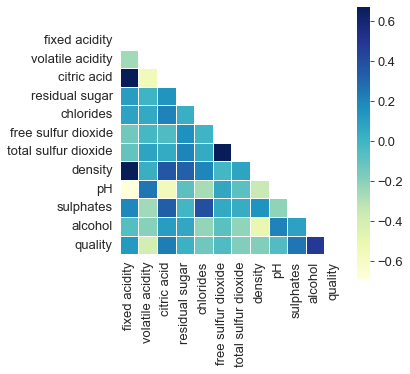

In [39]:
dfCorr = df.corr()
mask = np.zeros_like(dfCorr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(5, 5))
    ax = sns.heatmap(dfCorr,mask=mask,square=True,linewidths=.8,cmap="YlGnBu")

In [40]:
# "Filtrando" o percentual de correlação do dataframe
dfCorr = df.corr()
filteredDf = dfCorr[((dfCorr >= .5) | (dfCorr <= -.5)) & (dfCorr !=1.000)]

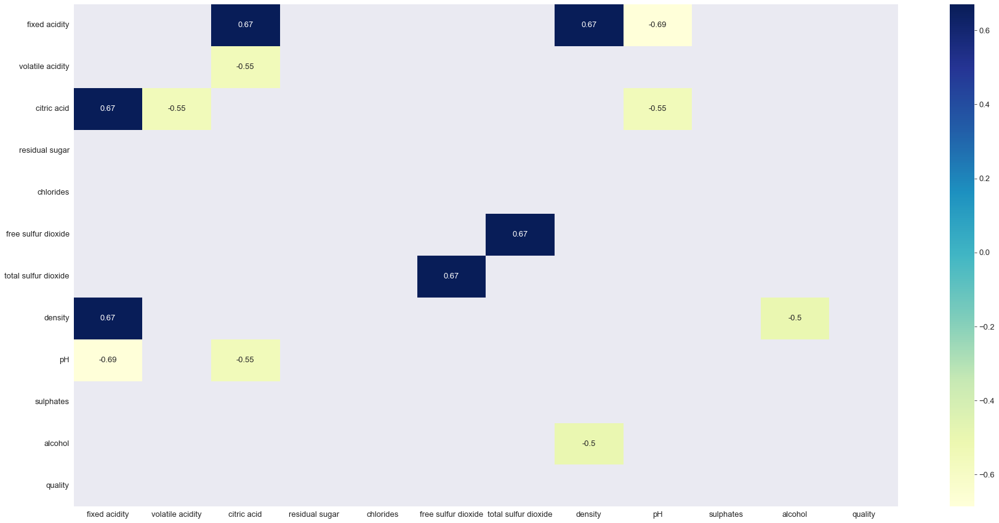

In [41]:
# Verificando a correlação entre as variáveis com heatmap
plt.figure(figsize=(30,15))
sns.heatmap(filteredDf, annot=True, cmap="YlGnBu")
plt.savefig("Plotting_Correlation_heatmap_r.jpg")
plt.show()

In [42]:
# Correlações

#residual sugar       está correlacionado  density            
#alcohol              está correlacionado  density            
#total sulfur dioxide está correlacionado  free sulfur dioxide


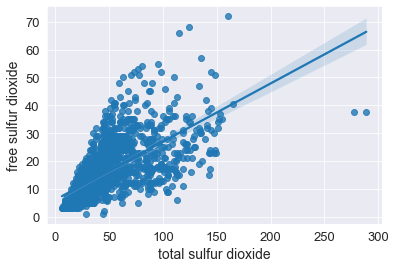

In [43]:
sns.regplot(x=df['total sulfur dioxide'], y=df['free sulfur dioxide'], fit_reg=True)
plt.show()

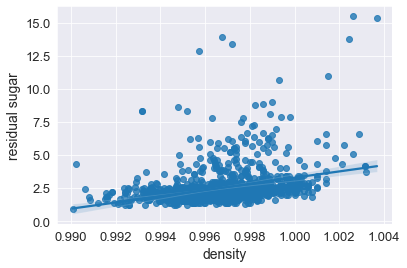

In [44]:
sns.regplot(x=df['density'], y=df['residual sugar'], fit_reg=True)
plt.show()

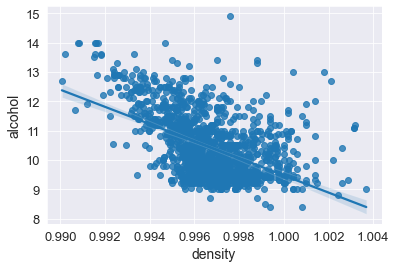

In [45]:
sns.regplot(x=df['density'], y=df['alcohol'], fit_reg=True)
plt.show()

#### Analisando as variáveis para identificar como estão distribuídas no conjunto de dados e os outliers

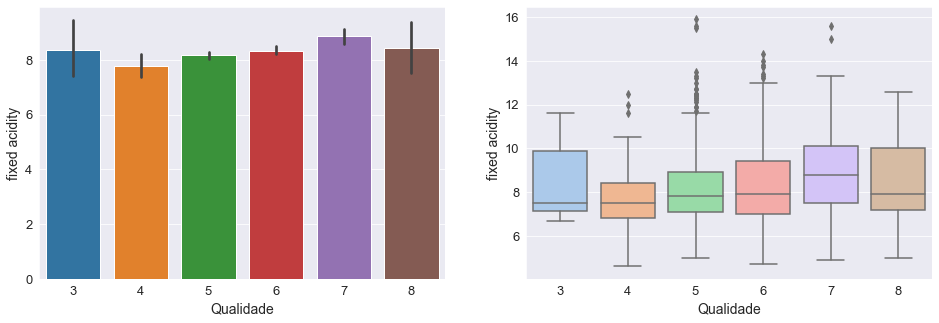

In [46]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'fixed acidity'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# Notamos que a tendência de acidez fixa diminui à medida que aumentamos a qualidade, mas inverte para a maior qualidade


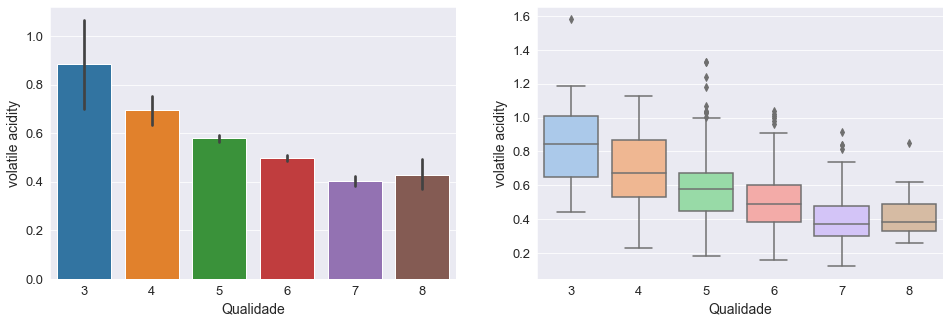

In [47]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'volatile acidity'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a volatile acidity (acidez volátil) não dá qualquer especificação para classificar a qualidade


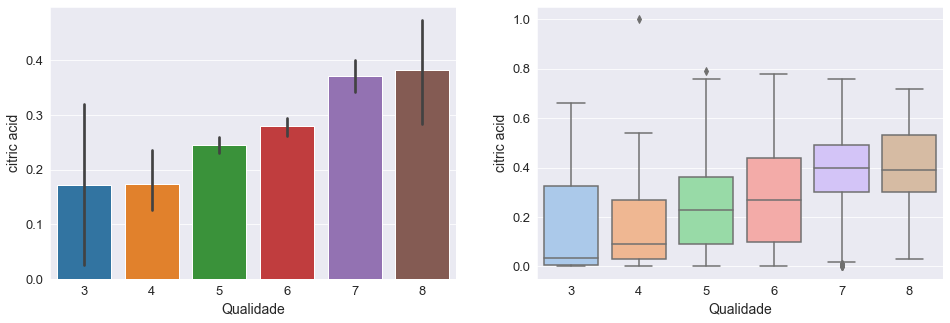

In [48]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'citric acid'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a citric acid (ácido cítrico) não dá qualquer especificação para classificar a qualidade


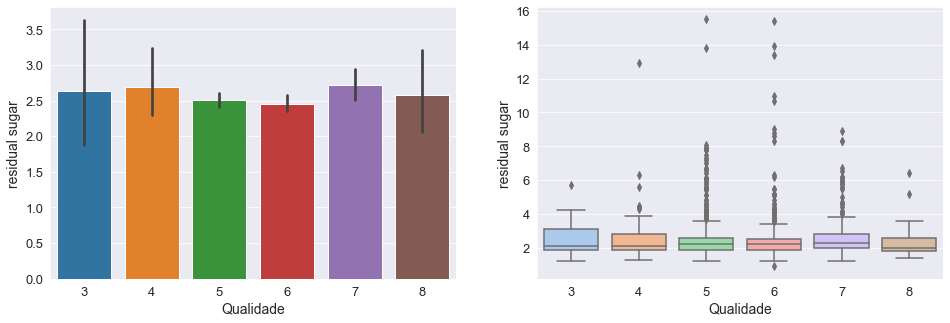

In [49]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'residual sugar'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a residual sugar (açúcar residual) não dá qualquer especificação para classificar a qualidade


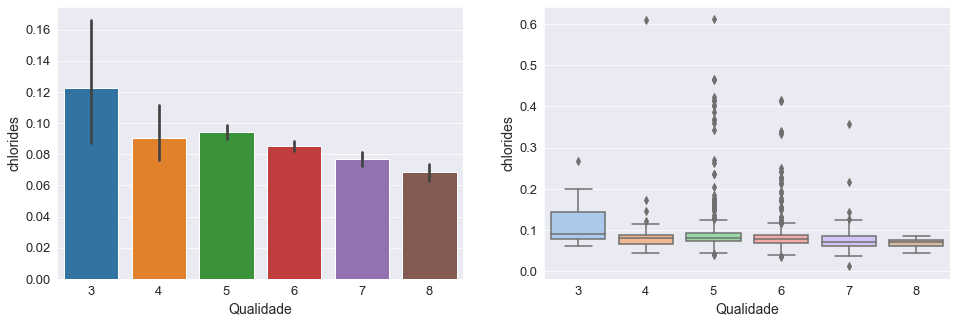

In [50]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'chlorides'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# Notamos que a tendência de cloretos diminui à medida que aumentamos a qualidade, com exceção da qualidade 4


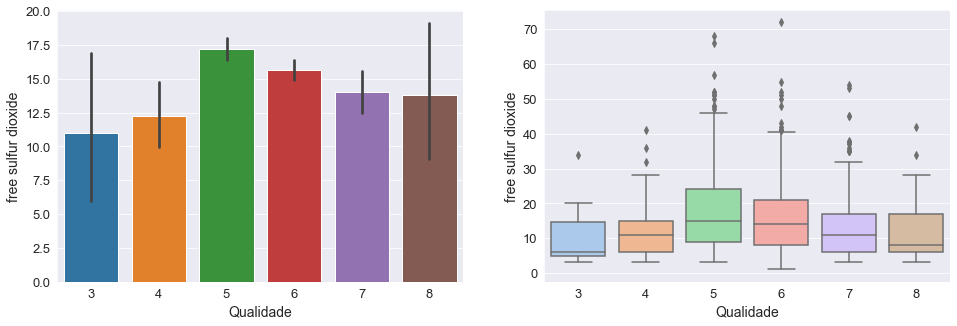

In [51]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'free sulfur dioxide'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a free sulfur dioxide (dióxido de enxofre livre) não dá qualquer especificação para classificar a qualidade


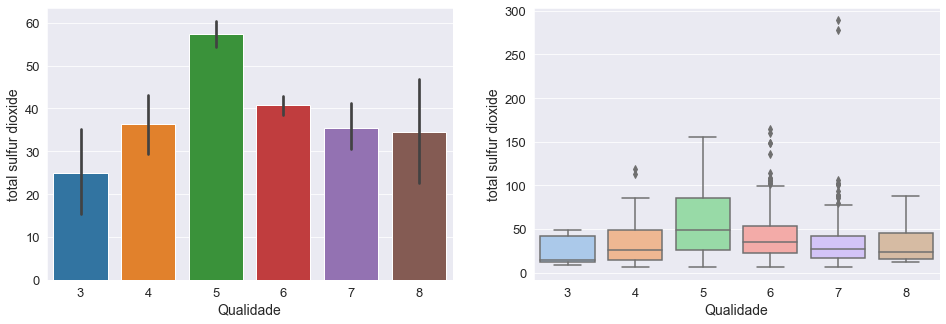

In [52]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'total sulfur dioxide'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# Notamos que a tendência de dióxido de enxofre total diminui à medida que aumentamos a qualidade, com exceção da qualidade 4


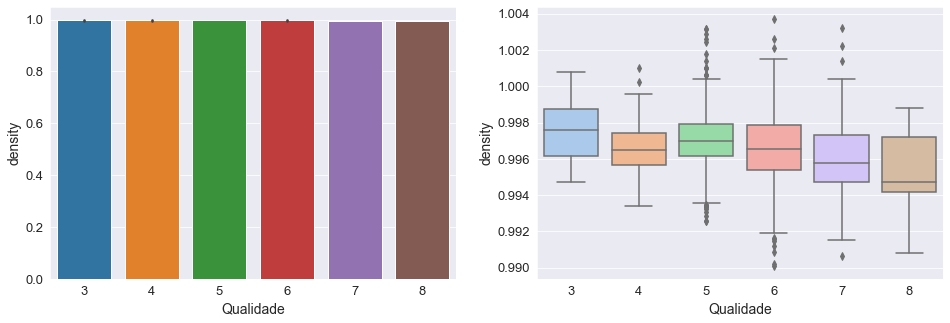

In [53]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'density'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a density (densidade) não dá qualquer especificação para classificar a qualidade


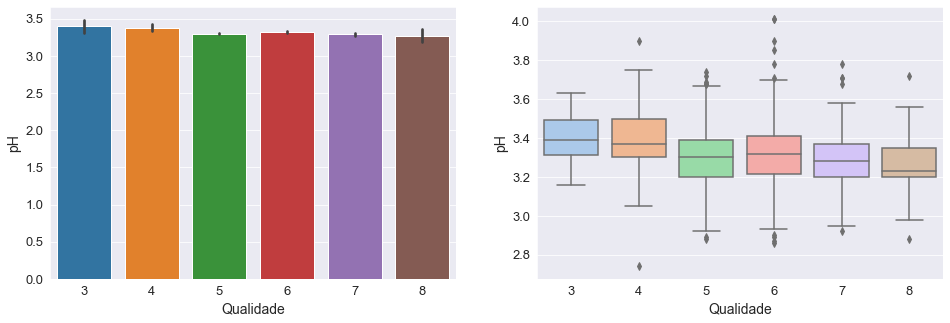

In [54]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'pH'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a ph (PH) não dá qualquer especificação para classificar a qualidade


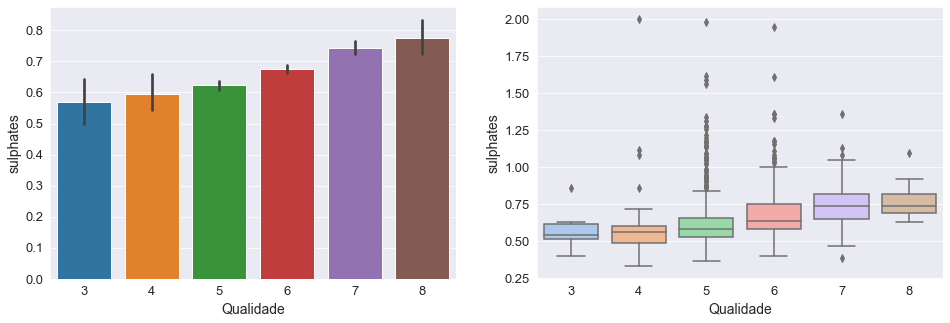

In [55]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'sulphates'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# a sulphates (sulfatos) não dá qualquer especificação para classificar a qualidade
# Notamos que a tendência de sulfatos aumenta à medida que aumentamos a qualidade, com exceção da qualidade 8 e 9


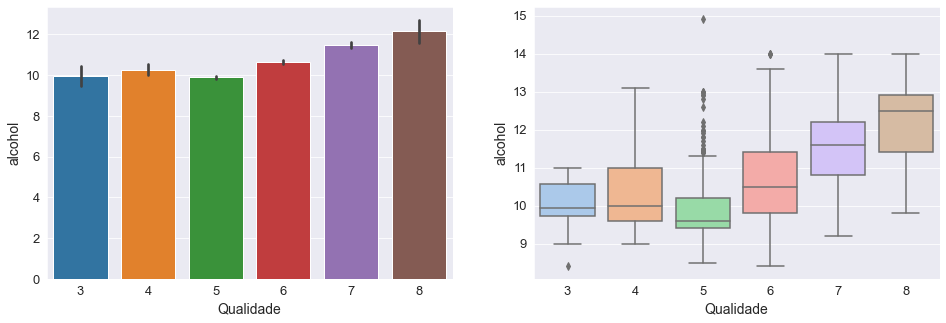

In [56]:
# Plotando gráfico para a distribuição de quality / Plotando boxplot para identificar Outliers
y = 'alcohol'

plt.figure(figsize=(16,5))

plt.subplot(1,2,1) # criar uma tabela de 1 linha e 2 colunas; este é o primeiro gráfico
sns.barplot(x = 'quality', y = y, data = df)
plt.xlabel('Qualidade')
plt.ylabel(y)

plt.subplot(1,2,2)  # Este é o segundo gráfico
ax = sns.boxplot(data = df, x = 'quality', y = y, palette=colors)
ax.set_xlabel('Qualidade') # Define o xlabel
ax.set_ylabel(y) # Define o ylabel

plt.show()

# Notamos que a tendência de álcool aumenta à medida que aumentamos a qualidade, com exceção da qualidade 3 e 4


Os boxplots mostram muitos outliers para todas as variáveis. 

## Etapa 2

**Regressão Linear**

### Preparando os dados

In [57]:
# Retirando os outliers

# IQR
# Definindo os outliers através do IQR
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1


# Criando dataframe sem Outliers através do IQR
df_out = df[~((df < (Q1 - 1.5 * IQR))|(df > (Q3 + 1.5 * IQR))).any(axis=1)]


# X e y arrays
Xo = df_out.drop('quality',axis=1)
yo = df_out['quality']


In [58]:
# Vamos dividir os nossos dados numa matriz X que contém as características a treinar, 
# e uma matriz y com a variável alvo, neste caso a coluna quality. 

# X e y arrays
X = df.drop('quality',axis=1)
y = df['quality']


### Separando em Train e Test

In [59]:
# Vamos dividir os dados num conjunto de Train e num conjunto de Test. 
# Iremos treinar o modelo no conjunto de treino e depois utilizaremos o conjunto de testes para avaliar o modelo

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(Xo, yo, test_size=0.3, random_state=42)

### Normalizando os dados

In [60]:
# A padronização de um conjunto de dados é um requisito comum a muitos estimadores de aprendizagem de máquinas: 
# podem comportar-se mal se as características individuais não se parecerem mais ou menos com dados distribuídos normalmente.

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([('std_scalar', StandardScaler())])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

### Linear Regression

In [61]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)

LinearRegression(normalize=True)

### Previsões do nosso Modelo

In [62]:
pred = lin_reg.predict(X_test)

In [63]:
pd.DataFrame({'quality': y_test, 'quality Previsto': pred}).hvplot.scatter(x='quality', y='quality Previsto')

:Scatter   [quality]   (quality Previsto)

### Métricas de Avaliação de Regressão

In [64]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

In [65]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
MAE: 0.4943500022653562
MSE: 0.4185465718806317
RMSE: 0.6469517539049042
R2 Square 0.3815371129418359
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.5170574209589965
MSE: 0.4407197084663642
RMSE: 0.6638672370785925
R2 Square 0.35017877163147104
__________________________________


## Etapa 3

**Regressão logística**

### Preparando os dados

In [66]:
# Criaremos uma nova coluna chamada reviews. 
# Esta coluna conterá os valores 1, 2 e 3 com os seguintes valores correspondentes Ruim, Médio e Excelente   
# Estes valores serão atribuidos da seguinte forma:  
# quality = 1,2,3 --> Ruim = 1
# quality = 4,5,6,7 --> Medio = 2
# quality = 8,9,10  --> Excelente = 3

#Create an empty list called reviews
reviews = []

for i in df['quality']:
    if i >= 1 and i <= 3:
        reviews.append('1')
    elif i >= 4 and i <= 7:
        reviews.append('2')
    elif i >= 8 and i <= 10:
        reviews.append('3')

df['reviews'] = reviews


In [67]:
Counter(df['reviews'])

Counter({'2': 1332, '3': 17, '1': 10})

In [68]:
# Vamos dividir os nossos dados numa matriz X que contém as características a treinar, 
# e uma matriz y com a variável alvo, neste caso a coluna quality. 

# X e y arrays
X = df.iloc[:,:11]
y = df['reviews']


### Normalizando os dados

In [69]:
# A padronização de um conjunto de dados é um requisito comum a muitos estimadores de aprendizagem de máquinas: 
# podem comportar-se mal se as características individuais não se parecerem mais ou menos com dados distribuídos normalmente.

sc = StandardScaler()
X = sc.fit_transform(X)

In [70]:
# Análise de componentes principais (PCA)
# Redução linear da dimensionalidade utilizando a Decomposição de Valor Singular dos dados para os projetar para um 
# espaço dimensional inferior. 
# Os dados de entrada são centrados mas não escalonados para cada característica antes da aplicação da SVD 
# (Singular Value Decomposition).

from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(X)


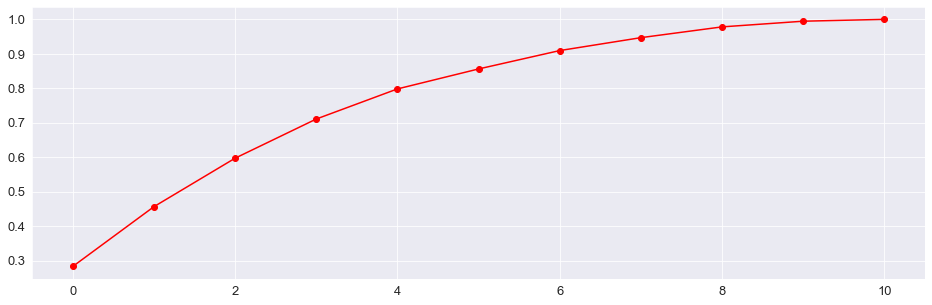

In [71]:
# Plotar o gráfico para encontrar os principais componente
plt.figure(figsize=(16,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.show()

In [72]:
#Pelo gráfico, podemos ver que 8 componentes principais atribuem 90% da variação dos dados. 
#colhemos os primeiros 8 componentes para a nossa previsão.
pca_new = PCA(n_components=8)
X_new = pca_new.fit_transform(X)


### Separando em Train e Test

In [73]:
# Vamos dividir os dados num conjunto de Train e num conjunto de Test. 
# Iremos treinar o modelo no conjunto de treino e depois utilizaremos o conjunto de testes para avaliar o modelo

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size = 0.3, random_state=42)


### Logistic Regression

In [74]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score

lr = LogisticRegression()
lr.fit(X_train, y_train)


LogisticRegression()

### Previsões do nosso Modelo

In [75]:
# Informações de Matriz de confusão e pontuação de precisão

lr_predict = lr.predict(X_test)
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)

print(f'Pontuação: {lr_acc_score:.2%} de acurácia com Regressão Logistica!')

Pontuação: 97.79% de acurácia com Regressão Logistica!


In [76]:
pd.DataFrame({'reviews': y_test, 'reviews Previsto': lr_predict}).hvplot.scatter(x='reviews', y='reviews Previsto')

:Scatter   [reviews]   (reviews Previsto)